In [46]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding
!pip install comet_ml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 710.6/710.6 kB 38.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 980.3/980.3 kB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 91.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.9/137.9 kB 13.3 MB/s eta 0:00:00
  Attempting uninstall: python-box
    Found existing installation: python-box 7.3.0
    Uninstalling python-box-7.3.0:
      Successfully uninstalled python-box-7.3.0


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 906.9/906.9 kB 52.2 MB/s eta 0:00:00


In [4]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n.pt")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 5.35M/5.35M [00:00<00:00, 166MB/s]


In [9]:
result = model.val(data='coco.yaml',
                   mode='detect',
                   imgsz=640,
                   device=0)

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


100%|██████████| 755k/755k [00:00<00:00, 92.5MB/s]
val: Scanning /content/datasets/coco/labels/val2017... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:15<00:00, 332.26it/s]


val: New cache created: /content/datasets/coco/labels/val2017.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [01:12<00:00,  4.33it/s]


                   all       5000      36335      0.652      0.505      0.548      0.392
                person       2693      10777      0.759      0.676      0.753      0.524
               bicycle        149        314      0.688      0.404      0.478      0.276
                   car        535       1918       0.66      0.534      0.585      0.376
            motorcycle        159        367       0.77      0.605      0.678      0.444
              airplane         97        143      0.799      0.797      0.869      0.689
                   bus        189        283      0.771      0.707      0.773      0.651
                 train        157        190      0.826      0.811      0.863      0.681
                 truck        250        414      0.584      0.415      0.478      0.323
                  boat        121        424      0.579      0.351      0.413       0.22
         traffic light        191        634      0.644      0.347      0.416      0.218
          fire hydran

In [11]:
result.results_dict

{'metrics/precision(B)': 0.6518207780841748,
 'metrics/recall(B)': 0.5047608210243022,
 'metrics/mAP50(B)': 0.5479932586380482,
 'metrics/mAP50-95(B)': 0.39219333699208603,
 'fitness': 0.40777332915668224}

In [10]:
result.speed

{'preprocess': 0.2968691825866699,
 'inference': 3.799556303024292,
 'loss': 0.0012038707733154298,
 'postprocess': 1.7057127952575684}

In [12]:
result.fitness

0.40777332915668224

In [13]:
yaml_file = "yolo11m.pt"
# Load a model
model = YOLO("yolo11m.pt")
result_v11m = model.val(data='coco.yaml',
                   mode='detect',
                   imgsz=640,
                   device=0)

100%|██████████| 38.8M/38.8M [00:00<00:00, 49.5MB/s]

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


YOLO11m summary (fused): 303 layers, 20,091,712 parameters, 0 gradients, 68.0 GFLOPs


val: Scanning /content/datasets/coco/labels/val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [03:01<00:00,  1.73it/s]


                   all       5000      36335      0.742      0.614      0.681      0.515
                person       2693      10777      0.838      0.746      0.841      0.631
               bicycle        149        314      0.784      0.542      0.654      0.417
                   car        535       1918      0.779      0.654      0.739      0.519
            motorcycle        159        367      0.788      0.714      0.795      0.551
              airplane         97        143      0.905      0.867      0.927      0.795
                   bus        189        283      0.852      0.814      0.888      0.769
                 train        157        190      0.893      0.879      0.938       0.76
                 truck        250        414      0.651      0.527      0.617      0.461
                  boat        121        424      0.724      0.489       0.59      0.354
         traffic light        191        634      0.734      0.448      0.557      0.314
          fire hydran

In [32]:
yaml_file = "yolo11m.pt"

fscore_parameters = {}
fscore_parameters.update(result_v11m.results_dict)
fscore_parameters.update(result_v11m.speed)
fscore_parameters.update({"fitness": result_v11m.fitness})
fscore_parameters.update({"save_dir": result_v11m.save_dir})
fscore_parameters.update({'model_name' : yaml_file})

In [33]:
for i, j in fscore_parameters.items():
  print(i, ">>", j)

metrics/precision(B) >> 0.7423506108033054
metrics/recall(B) >> 0.6144470576213816
metrics/mAP50(B) >> 0.6809433457730554
metrics/mAP50-95(B) >> 0.5153761106713504
fitness >> 0.5319328341815209
preprocess >> 0.2809688091278076
inference >> 16.95013847351074
loss >> 0.002022552490234375
postprocess >> 2.0935309410095213
save_dir >> runs/detect/val3
model_name >> yolo11m.pt


In [36]:
yaml_file = "yolo11x.pt"
# Load a model
model = YOLO("yolo11x.pt")
result_v11x = model.val(data='coco.yaml',
                   mode='detect',
                   imgsz=640,
                   device=0)

100%|██████████| 109M/109M [00:00<00:00, 200MB/s]


Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11x summary (fused): 464 layers, 56,919,424 parameters, 0 gradients, 194.9 GFLOPs


val: Scanning /content/datasets/coco/labels/val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [04:09<00:00,  1.26it/s]


                   all       5000      36335      0.739      0.659      0.713      0.549
                person       2693      10777      0.837      0.773      0.859      0.657
               bicycle        149        314      0.737      0.623      0.685       0.45
                   car        535       1918      0.772      0.697      0.772      0.555
            motorcycle        159        367      0.797      0.769      0.822      0.589
              airplane         97        143      0.865      0.902      0.934      0.809
                   bus        189        283      0.861      0.841      0.906      0.802
                 train        157        190      0.929      0.891      0.957      0.783
                 truck        250        414      0.673      0.556      0.645      0.491
                  boat        121        424      0.752      0.572      0.635       0.38
         traffic light        191        634      0.752      0.492      0.605      0.347
          fire hydran

In [37]:
yaml_file = "yolo11x.pt"

fscore_parameters = {}
fscore_parameters.update(result_v11x.results_dict)
fscore_parameters.update(result_v11x.speed)
fscore_parameters.update({"fitness": result_v11x.fitness})
fscore_parameters.update({"save_dir": result_v11x.save_dir})
fscore_parameters.update({'model_name' : yaml_file})

for i, j in fscore_parameters.items():
  print(i, ">>", j)

metrics/precision(B) >> 0.7394245545196807
metrics/recall(B) >> 0.658543097364237
metrics/mAP50(B) >> 0.7133688475973943
metrics/mAP50-95(B) >> 0.5486961717469716
fitness >> 0.565163439332014
preprocess >> 0.22616872787475586
inference >> 43.46446332931519
loss >> 0.0011722564697265625
postprocess >> 0.917613935470581
save_dir >> runs/detect/val6
model_name >> yolo11x.pt


# **여러 파일들 (*.pt)을 동시에 실행하도록 함.**

In [53]:
import os
import gc
import torch

In [40]:
try_no = 0
project_name=f"server-T4_coco_{try_no}_"

yaml_folder = "weights"
yaml_files = [f for f in os.listdir(yaml_folder) if f.endswith('.pt')]

In [47]:
from comet_ml import start
from comet_ml.integration.pytorch import log_model
from comet_ml import Experiment
import comet_ml

In [48]:
comet_ml.init()


COMET WARNING: comet_ml.init() is deprecated and will be removed soon. Please use comet_ml.login()


Please paste your Comet API key from https://www.comet.com/api/my/settings/
(api key may not show as you type)
Comet API key: ··········


COMET INFO: Valid Comet API Key saved in /root/.comet.config (set COMET_CONFIG to change where it is saved).
COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: torch.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Experiment is live on comet.com https://www.comet.com/blueoxss/server-t4-coco-0/9df7dd4456684432a1bb6f3ee2ab48f8



In [ ]:
yaml_files = ['yolov10n.pt', 'yolov10m.pt', 'yolov10x.pt']

In [50]:
# 각 YAML 파일에 대해 반복 실행
for i, yaml_file in enumerate(yaml_files):
  experiment = start(
    api_key="loy5O9AUv0iM7uexdfjOyVEjI",
    workspace="blueoxss",
    project=project_name
  )
  os.environ["COMET_EVAL_LOG_CONFUSION_MATRIX"] = "false"

  yaml_path = os.path.join(yaml_folder, yaml_file)

  # 모델 로드
  try:
      model = YOLO(yaml_path)
      result = model.val(
          data="coco.yaml",  # 데이터 경로
          mode="detect",
          device=0,                        # GPU 장치 선택
          imgsz=640,                            # 입력 이미지 크기
          save_json=Ture,
          project=f'{project_name}_validation'      # 프로젝트명 설정
      )

      fscore_parameters = {}
      fscore_parameters.update(result.results_dict)
      fscore_parameters.update(result.speed)
      fscore_parameters.update({"fitness": result.fitness})
      fscore_parameters.update({"save_dir": result.save_dir})
      fscore_parameters.update({'model_name' : yaml_file})
      experiment.log_parameters(fscore_parameters)

  except Exception as e:
      print(f"Error processing {yaml_file}: {e}")
  finally:
      torch.cuda.empty_cache()
      gc.collect()

    # 결과 출력
  experiment.end()

Ultralytics 8.3.61 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv11-v5 summary (fused): 387 layers, 58,436,320 parameters, 0 gradients, 225.8 GFLOPs


val: Scanning /content/datasets/coco/labels/val2017.cache... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [03:52<00:00,  1.34it/s]


                   all       5000      36335      0.726      0.638      0.689      0.521
                person       2693      10777      0.842       0.75      0.843      0.632
               bicycle        149        314      0.752      0.552       0.65      0.426
                   car        535       1918      0.751      0.667       0.74      0.525
            motorcycle        159        367      0.801      0.698      0.789      0.559
              airplane         97        143      0.881      0.888      0.931      0.781
                   bus        189        283      0.842      0.823       0.87      0.753
                 train        157        190      0.884      0.911      0.944      0.777
                 truck        250        414       0.66       0.53      0.639      0.468
                  boat        121        424      0.735      0.481      0.583      0.347
         traffic light        191        634      0.714      0.517      0.579      0.327
          fire hydran

NameError: name 'torch' is not defined

In [ ]:
for i, j in fscore_parameters.items():
  print(i, ">>", j)

In [55]:
torch.cuda.empty_cache()
gc.collect()
experiment.end()

COMET WARNING: Couldn't retrieve and log Google Colab notebook content, reason: 'NoneType' object is not subscriptable
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     name                  : governing_buzzard_1272
COMET INFO:     url                   : https://www.comet.com/blueoxss/server-t4-coco-0/9df7dd4456684432a1bb6f3ee2ab48f8
COMET INFO:   Others:
COMET INFO:     notebook_url : https://colab.research.google.com/notebook#fileId=https%3A%2F%2Fgithub.com%2Froboflow-ai%2Fnotebooks%2Fblob%2Fmain%2Fnotebooks%2Ftrain-yolo-nas-on-custom-dataset.ipynb
COMET INFO:   Parameters:
COMET INFO:     fitness              : 0.5378435790768513
COMET INFO:     inference            : 39.11866641044617
COMET INFO:     loss             

In [ ]:
fscore_parameters = {}
fscore_parameters.update(result.results_dict)
fscore_parameters.update(result.speed)
fscore_parameters.update(result.fitness)
fscore_parameters.update(result.save_dir)
fscore_parameters.update({'model_name' : yaml_file})
experiment.log_parameters(fscore_parameters)

[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLO-NAS on Custom Dataset

This notebook is based on official [YOLO-NAS Notebook](https://colab.research.google.com/drive/1q0RmeVRzLwRXW-h9dPFSOchwJkThUy6d?usp=sharing) by DECI AI.

![YOLO-NAS on RF100](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_rf100.png)

## ⚠️ Disclaimer

YOLO-NAS is still very fresh. If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install YOLO-NAS
- Inference with pre-trained COCO model
- Finding open source datasets
- ⭐️ Training YOLO-NAS on your custom dataset ⭐️
- Load trained model
- Evaluate trained model
- Inference with trained model

## 🔥 Let's begin!

## ⚡ Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Wed Nov 27 16:30:50 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P8              13W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install YOLO-NAS


In [ ]:
!pip install -q roboflow==1.1.49
!pip install -q supervision==0.25.0

In [ ]:
# URLs changed for YOLO-NAS models, but the authors aren't updating the repo
# Issue: https://github.com/Deci-AI/super-gradients/issues/2057
# Fix PR: https://github.com/Deci-AI/super-gradients/pull/2061

# Option 1 - Install from patched branch. Does not work, causes different errors!
# !pip install -q git+https://github.com/hannadiamond/super-gradients@patch-1

# Option 2 - Install normally, and modify code
# Pip errors are expected.
!pip install -q git+https://github.com/Deci-AI/super-gradients.git@stable
!sed -i -e "s/sghub.deci.ai/sg-hub-nv.s3.amazonaws.com/g" /usr/local/lib/python3.10/dist-packages/super_gradients/training/pretrained_models.py
!sed -i -e "s/sghub.deci.ai/sg-hub-nv.s3.amazonaws.com/g" /usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/checkpoint_utils.py

### 🚨 Restart the runtime

**After installation is complete, you'll need to restart the runtime after installation completes. Navigate to `Runtime` -> `Restart runtime` and confirm by clicking `Yes` when you see the popup.**

After that, carry on with the notebook starting from the cell below 👇

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Inference with pre-trained COCO model

Start by instantiating a pretrained model. YOLO-NAS architecture comes in three different sizes: `yolo_nas_s`, `yolo_nas_m`, `and yolo_nas_l`. We will use `yolo_nas_l` throughout this notebook. Keep in mind that depending on your use-case your decision may be different. Take a peek at the diagram below visualizing the speed-accuracy tradeoff.

<br>

![YOLO-NAS](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_frontier.png)


In [ ]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

In [ ]:
from super_gradients.training import models

model = models.get(MODEL_ARCH, pretrained_weights="coco").to(DEVICE)

The console stream is logged into /root/sg_logs/console.log


[2024-11-27 16:32:25] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2024-11-27 16:32:43] INFO - utils.py - NumExpr defaulting to 2 threads.
[2024-11-27 16:32:49] INFO - env_sanity_check.py - Library check is not supported when super_gradients installed through "git+https://github.com/..." command
[2024-11-27 16:32:50] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-11-27 16:32:50] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions 

### Use Example Data (Below, We'll Prepare Our Own Custom Dataset)

Let's download few example images. Feel free to replace my images with yours. All you have to do is upload them to the `{HOME}/data` directory. If you're looking for data, take a peek at [Roboflow Universe](https://universe.roboflow.com/)! You're sure to find something interesting.

In [ ]:
f"{HOME}/data"

'/content/data'

In [ ]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-5.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-6.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-7.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-8.jpeg

/content
/content/data


### Single Image Inference

In [ ]:
SOURCE_IMAGE_PATH = f"{HOME}/data/dog-3.jpeg"

In [ ]:
import cv2

image = cv2.imread(SOURCE_IMAGE_PATH)
result = model.predict(image, conf=0.35)

/usr/local/lib/python3.10/dist-packages/super_gradients/training/pipelines/pipelines.py:210: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with eval_mode(self.model), torch.no_grad(), torch.cuda.amp.autocast(enabled=self.fp16):
[2024-11-27 16:33:54] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


### Output format

For every image YOLO-NAS will produce `ImageDetectionPrediction` object containing the following fields:
- `image` - `numpy.ndarray` - image used for inference
- `class_names` - `List[str]` - list of categories used for training the model
- `prediction` - `DetectionPrediction` - class instance containing detailed informationabout the obtained detections
   - `bboxes_xyxy` - `numpy.ndarray` of `float32` and `(N, 4)` shape - detection bounding boxes in `xyxy` format
   - `confidence` - `numpy.ndarray` of `float32` and `(N,)` shape - confidence value between `0` and `1`
   - `labels` - `numpy.ndarray` of `float32` and `(N,)` shape - `class_id` related to the index in the `class_names` list

In [ ]:
type(result)

super_gradients.training.utils.predict.prediction_results.ImageDetectionPrediction

### Visualize Inference Result

As with other models, you can use Supervision to visualize your results. You can read more about the integration between Supervision and YOLO-NAS [here](https://roboflow.github.io/supervision/detection/core/#supervision.detection.core.Detections.from_yolo_nas), and about visualizing detection [here](https://roboflow.github.io/supervision/detection/annotate/#supervision.detection.annotate.BoxAnnotator.annotate).

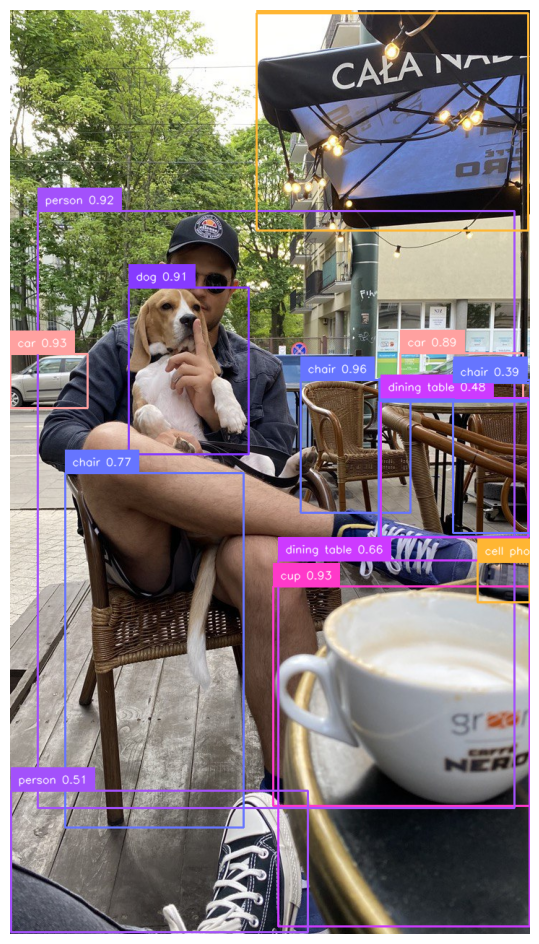

In [ ]:
import supervision as sv

detections = sv.Detections(
    xyxy=result.prediction.bboxes_xyxy,
    confidence=result.prediction.confidence,
    class_id=result.prediction.labels.astype(int)
)

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

labels = [
    f"{result.class_names[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _, _
    in detections
]


annotated_frame = image.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections
)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels
)

%matplotlib inline
sv.plot_image(annotated_frame, (12, 12))

## Over 100k Open Source Computer Vision Datasets are on Roboflow Universe

Need data for your project? Before spending time on annotating, check out Roboflow Universe, a repository of more than 110,000 open-source datasets that you can use in your projects. You'll find datasets containing everything from annotated cracks in concrete to plant images with disease annotations.


[![Roboflow Universe](https://media.roboflow.com/notebooks/template/uni-banner-frame.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672878480290)](https://universe.roboflow.com/)



# Training YOLO-NAS on a Custom Dataset

## Preparing a custom dataset

Building a custom dataset can be a painful process. It might take dozens or even hundreds of hours to collect images, label them, and export them in the proper format. Fortunately, Roboflow makes this process as straightforward and fast as possible. Let me show you how!

### Step 1: Creating project

Before you start, you need to create a Roboflow [account](https://app.roboflow.com/login). Once you do that, you can create a new project in the Roboflow [dashboard](https://app.roboflow.com/). Keep in mind to choose the right project type. In our case, Object Detection.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/creating-project.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1672929799852"
  >
</div>

### Step 2: Uploading images or video

Next, add the data to your newly created project. You can do it via API or through our [web interface](https://docs.roboflow.com/adding-data/object-detection).

If you drag and drop a directory with a dataset in a supported format, the Roboflow dashboard will automatically read the images and annotations together.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/uploading-images.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1672929808290"
  >
</div>

### Step 3: Labeling

If you only have images, you can label them in [Roboflow Annotate](https://docs.roboflow.com/annotate).

<div align="center">
  <img
    width="640"
    src="https://user-images.githubusercontent.com/26109316/210901980-04861efd-dfc0-4a01-9373-13a36b5e1df4.gif"
  >
</div>

### Step 4: Generate new dataset version

Now that we have our images and annotations added, we can Generate a Dataset Version. When Generating a Version, you may elect to add preprocessing and augmentations. This step is completely optional, however, it can allow you to significantly improve the robustness of your model.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/generate-new-version.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1673003597834"
  >
</div>

### Step 5: Exporting dataset

Once the dataset version is generated, we have a hosted dataset we can load directly into our notebook for easy training. Click `Export` and select the `YOLO v5 PyTorch` dataset format.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/export.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1672943313709"
  >
</div>




In [ ]:
%cd {HOME}

import roboflow
from roboflow import Roboflow

roboflow.login()

rf = Roboflow()

project = rf.workspace("roboflow-jvuqo").project("football-players-detection-2frwp")
dataset = project.version(1).download("yolov5")

/content
visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Football-Players-Detection-1 in yolov5pytorch:: 100%|██████████| 2258/2258 [00:00<00:00, 3562.83it/s]


In [ ]:
LOCATION = dataset.location
print("location:", LOCATION)
CLASSES = sorted(project.classes.keys())
print("classes:", CLASSES)

location: /content/Football-Players-Detection-1
classes: ['ball', 'goalkeeper', 'player', 'referee']


## Fine-tune on custom dataset

`ckpt_root_dir` - this is the directory where results from all your experiments will be saved

`experiment_name` - all checkpoints, logs, and tensorboards will be saved in a directory with the name you specify here.

In [ ]:
MODEL_ARCH = 'yolo_nas_l'
BATCH_SIZE = 8
MAX_EPOCHS = 25
CHECKPOINT_DIR = f'{HOME}/checkpoints'
EXPERIMENT_NAME = project.name.lower().replace(" ", "_")

In [ ]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

In [ ]:
dataset_params = {
    'data_dir': LOCATION,
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': CLASSES
}

In [ ]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

Caching annotations: 100%|██████████| 13/13 [00:00<00:00, 3111.15it/s]


**NOTE:** Let's inspect our dataset

In [ ]:
train_data.dataset.transforms

### Instantiate the model

In [ ]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    pretrained_weights="coco"
)

[2023-05-10 10:22:20] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


### Define metrics and training parameters

In [ ]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

### Train the model

In [ ]:
trainer.train(
    model=model,
    training_params=train_params,
    train_loader=train_data,
    valid_loader=val_data
)

### Analyze training metrics


In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

<IPython.core.display.Javascript object>

## Zip and download fine-tuned model

In [ ]:
!zip -r yolo_nas.zip {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

In [ ]:
# if you experience 'NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968' error, run code below 👇

# import locale
# locale.getpreferredencoding = lambda: "UTF-8"

## Load trained model

In [ ]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    checkpoint_path=f"{CHECKPOINT_DIR}/{EXPERIMENT_NAME}/average_model.pth"
).to(DEVICE)

[2023-05-10 12:13:21] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/football_players_detection/average_model.pth EMA checkpoint.


## Evaluate trained model

In [ ]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Test: 100%|██████████| 2/2 [00:01<00:00,  1.27it/s]


{'PPYoloELoss/loss_cls': 0.6464156,
 'PPYoloELoss/loss_iou': 0.17030455,
 'PPYoloELoss/loss_dfl': 0.5683415,
 'PPYoloELoss/loss': 1.3563476,
 'Precision@0.50': tensor(0.2753),
 'Recall@0.50': tensor(0.8598),
 'mAP@0.50': tensor(0.8048),
 'F1@0.50': tensor(0.4014)}

### Inference with trained model

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml",
    force_masks=False
)

In [ ]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = list(best_model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

### Visualize inference results

In [ ]:
import random
random.seed(10)

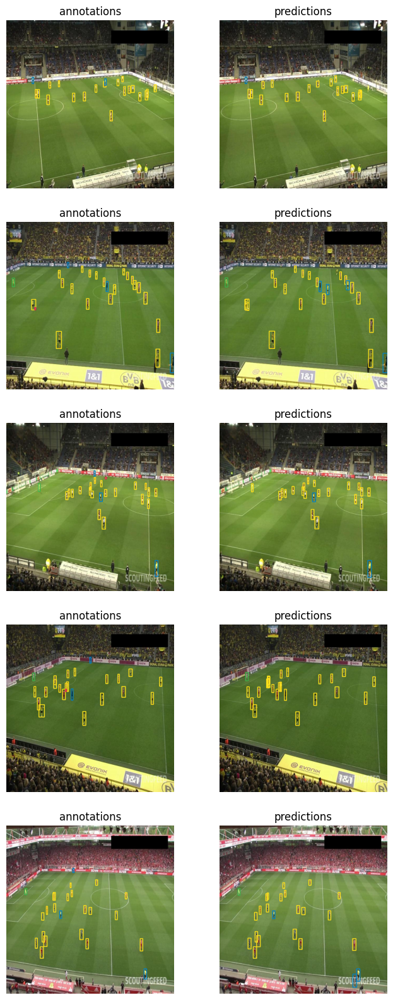

In [ ]:
import supervision as sv

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

### Calculate confusion matrix

In [ ]:
!pip install onemetric

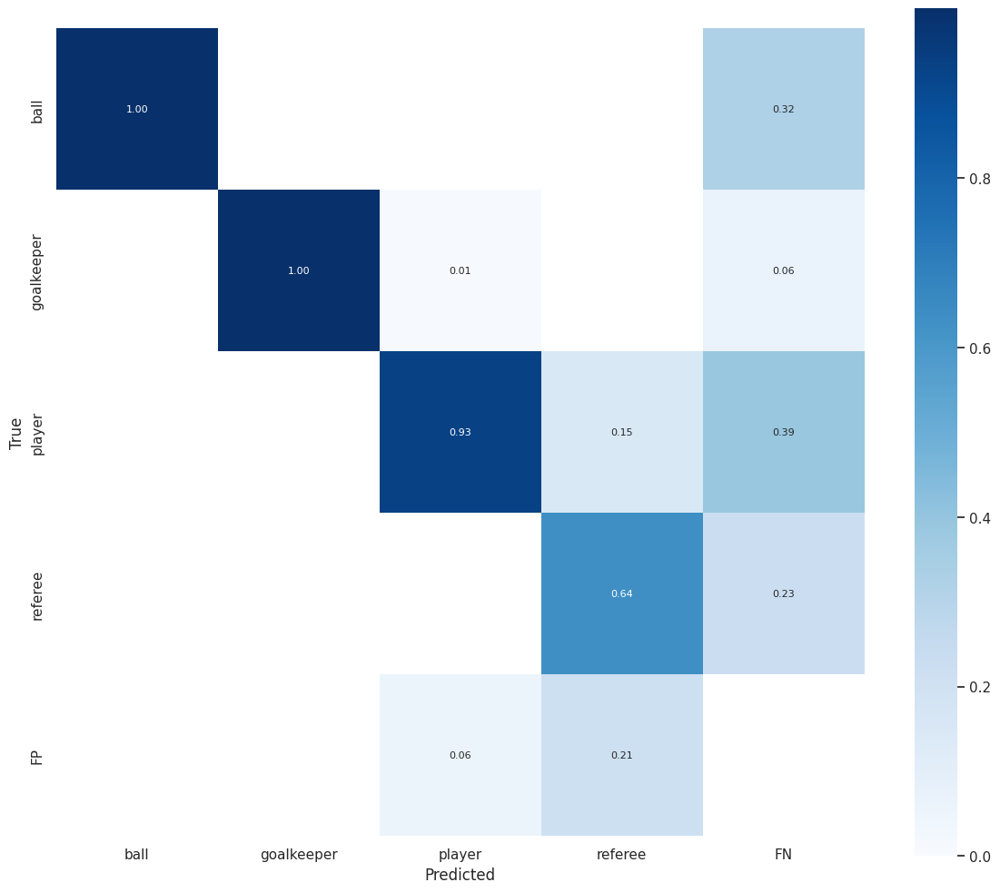

In [ ]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

  # 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.